# 2D Kuramoto-Sivashinsky Equation Simulation (Zero Mean)

This notebook simulates the 2D Kuramoto-Sivashinsky equation, enforcing a zero mean on the solution at each time step. The simulation is performed on a periodic domain using a spectral method with a semi-implicit time-stepping scheme.

The equation is given by:
$$ \frac{\partial u}{\partial t} = -\nabla^2 u - \epsilon \nabla^4 u - \frac{\lambda}{2} |\nabla u|^2 $$
where the linear part is unstable at large scales and stable at small scales, and the nonlinear term provides saturation.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

## Parameters
Define the physical and numerical parameters for the simulation.

In [2]:
N = 128          # Grid resolution
L_box = 64.0     # Domain size (large enough to support chaotic dynamics)
dt = 0.05        # Time step
epsilon = 1.0    # Hyperdiffusion coefficient
lamb = 1.0       # Nonlinearity coefficient
n_steps = 6000   # Total time steps
steps_per_frame = 50 # Animation interval

## Spatial grid and wavenumbers
Set up the computational grid and the corresponding wavenumbers for the Fourier transform.

In [3]:
x = np.linspace(0, L_box, N, endpoint=False)
X, Y = np.meshgrid(x, x)

# Wavenumbers for FFT
k = 2 * np.pi * np.fft.fftfreq(N, d=L_box/N)
Kx, Ky = np.meshgrid(k, k)
K2 = Kx**2 + Ky**2
K4 = K2**2

## Initial condition
The simulation is initialized with small random noise. The mean of the initial condition is set to zero by setting the (0,0) component of its Fourier transform to zero.

In [4]:
# Small random noise to seed the instability
np.random.seed(42)
u = 0.1 * (np.random.rand(N, N) - 0.5)

# Transform to Fourier space
u_hat = np.fft.fft2(u)
u_hat[0, 0] = 0.0

## Simulation
The simulation uses a semi-implicit Euler scheme in Fourier space. The zero-mean constraint is enforced at each step by setting `u_hat[0, 0] = 0.0`.

In [5]:
# Spectral operator for the linear part:
L_linear = K2 - epsilon * K4

# Precompute denominator for semi-implicit Euler step
denom = 1 - dt * L_linear

u_movie = []

for i in range(n_steps):
    # Record frame
    if i % steps_per_frame == 0:
        u_real = np.real(np.fft.ifft2(u_hat))
        u_movie.append(u_real)
    
    # Compute nonlinear term in real space
    ux_hat = 1j * Kx * u_hat
    uy_hat = 1j * Ky * u_hat
    
    ux = np.real(np.fft.ifft2(ux_hat))
    uy = np.real(np.fft.ifft2(uy_hat))
    
    nonlinear_real = -0.5 * lamb * (ux**2 + uy**2)
    nonlinear_hat = np.fft.fft2(nonlinear_real)
    
    # Semi-implicit update
    u_hat = (u_hat + dt * nonlinear_hat) / denom
    u_hat[0, 0] = 0.0

# Append final state
u_real = np.real(np.fft.ifft2(u_hat))
u_movie.append(u_real)

## Animation
Visualize the time evolution of the system.

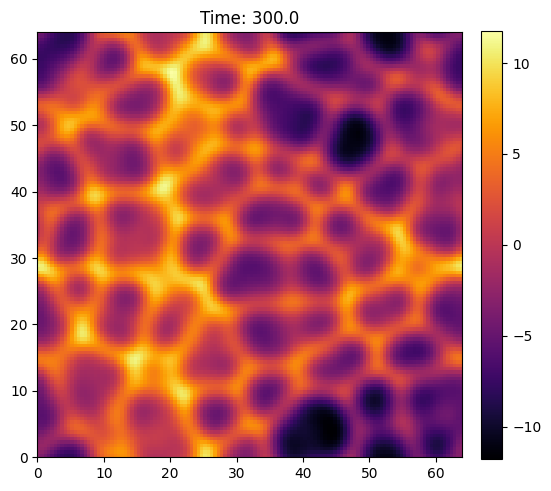

In [6]:
fig, ax = plt.subplots(figsize=(6, 6))
im = ax.imshow(u_movie[0], cmap='inferno', animated=True, origin='lower', extent=[0, L_box, 0, L_box])
ax.set_title('Kuramoto-Sivashinsky Evolution (Zero Mean)')
plt.colorbar(im, fraction=0.046, pad=0.04)

def update(frame):
    im.set_array(u_movie[frame])
    im.set_clim(np.min(u_movie[frame]), np.max(u_movie[frame]))
    ax.set_title(f'Time: {frame * steps_per_frame * dt:.1f}')
    return im,

# Create the animation
anim = FuncAnimation(fig, update, frames=len(u_movie), blit=True, interval=50)

# Display the animation
HTML(anim.to_jshtml())